# OpenCV Library


Estimated time needed: **60** minutes


<h2>Objectives</h2>


Image processing and computer vision tasks include displaying, cropping, flipping, rotating,  image segmentation, classification, image restoration,  image recognition, image generation.  Also, working with images via the cloud requires storing and transmitting, and gathering images through the internet. 
Python is an excellent choice as it has many image processing tools, computer vision, and artificial intelligence libraries. Finally, it has many libraries for working with files in the cloud and the internet.
A digital image is simply a file on your computer. In this lab, you will gain an understanding  of these files and learn to work with these files with some popular libraries


<ul>
    <li><a href='#PIL'>Open CV </a>
        <ul>
            <li>Image Files and Paths  </li>
            <li>Load in Image in Python</li>
            <li>Plotting an Image </li>
            <li>Gray Scale Images, Quantization and Color Channels  </li>
            <li>Gray Scale Images, Quantization and Color Channels  </li>
        </ul>
    </li>
    
</ul>


----


Download the image for the lab:


In [ ]:
import urllib.request  
# Import module urllib.request dùng để gửi request HTTP (tải dữ liệu từ Internet)

urls = [
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png",
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png",
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png"
]
# Danh sách các URL chứa đường dẫn đến các file ảnh cần tải

names = ["lenna.png", "baboon.png", "barbara.png"]
# Danh sách tên file tương ứng để lưu ảnh sau khi tải về

for url, name in zip(urls, names):
    # zip() ghép từng URL với từng tên file theo cặp
    # Ví dụ: (urls[0], names[0]), (urls[1], names[1]), ...

    urllib.request.urlretrieve(url, name)
    # Gửi request tới URL để tải dữ liệu
    # Sau đó lưu dữ liệu đó thành file với tên 'name' trên máy

print("Downloaded!")
# In thông báo khi tất cả các file đã được tải xong

'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.


First, let's define a helper function to concatenate two images side-by-side. You will need to understand this code this moment, but this function will be used repeatedly in this tutorial to showcase the results.


In [ ]:
from PIL import Image  # Phải dùng PIL để xử lý ảnh

def get_concat_h(im1, im2):
    """
    Nối hai ảnh theo chiều ngang (horizontal concat)
    
    Tham số:
    im1, im2: đối tượng PIL.Image
    
    Trả về:
    dst: ảnh mới đã nối
    """
    
    # Tạo một ảnh mới có kích thước đủ để chứa cả hai ảnh bên cạnh nhau
    # Chiều rộng = tổng chiều rộng của im1 + im2
    # Chiều cao = chiều cao của im1 (giả sử hai ảnh cao bằng nhau)
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    
    # Dán im1 vào ảnh mới, góc trái trên (0,0)
    dst.paste(im1, (0, 0))
    
    # Dán im2 vào bên phải im1, nên vị trí x = im1.width, y = 0
    dst.paste(im2, (im1.width, 0))
    
    # Trả về ảnh mới đã nối
    return dst


## Image Files and Paths  


An image is stored as a file on your computer. Below, we define `my_image` as the filename of a file in this directory.


In [ ]:
my_image = "lenna.png"
# Gán biến my_image với chuỗi "lenna.png"
# Chuỗi này là tên file ảnh (hoặc đường dẫn tới file ảnh) sẽ được sử dụng trong các bước xử lý tiếp theo

Filename consists of two parts, the name of the file and the extension, separated by a full stop (`.`). The extension specifies the format of the image. There are two popular image formats -- Joint Photographic Expert Group image (or `.jpg`, `.jpeg`) and Portable Network Graphics (or `.png`). These file types make it simpler to work with images. For example, it compresses the image using sine/cosine approximations, taking less spaces on your drive to store the image.


Image files are stored in the file system of your computer. The location of it is specified using a "path", which is often unique. You can find the path of your current working directory with Python's `os` module. The `os` module provides functions to interact with the file system, e.g. creating or removing a directory (folder), listing its contents, changing and identifying the current working directory. 


In [ ]:
import os
# Import module os để làm việc với hệ điều hành (thư mục, file, đường dẫn...)

cwd = os.getcwd()
# os.getcwd() = get current working directory
# Lấy đường dẫn thư mục làm việc hiện tại của chương trình Python
# Đây là nơi Python sẽ tìm file (ví dụ: lenna.png) nếu không ghi đường dẫn đầy đủ

cwd
# Trả về (hiển thị) giá trị của biến cwd trong Jupyter Notebook
# Kết quả là đường dẫn thư mục hiện tại 

'c:\\Users\\Dung\\Downloads'

The "path" to an image can be found using the following line of code.


In [ ]:
#image_path = os.path.join(cwd, my_image)

image_path = "c:\\Users\\Dung\\Downloads\lenna.png".encode('utf-8').decode()
# Đây là đường dẫn tuyệt đối tới file ảnh trên Windows

image_path
# Lệnh này in ra giá trị hiện tại của biến image_path

'c:\\Users\\Dung\\Downloads\\lenna.png'

## Load in Image in Python


OpenCV is a library used for computer vision. It has more functionality than the `PIL` library but is more difficult to use. We can import `OpenCV` as follows:


In [ ]:
import sys  # Nhập module sys, chứa thông tin về môi trường Python hiện tại

print(sys.version)     
# In ra phiên bản Python hiện tại

print(sys.executable) 
# In ra đường dẫn tuyệt đối đến trình thông dịch Python đang sử dụng
# Ví dụ: 'C:\\Users\\Dung\\AppData\\Local\\Programs\\Python\\Python311\\python.exe'

3.11.9 (tags/v3.11.9:de54cf5, Apr  2 2024, 10:12:12) [MSC v.1938 64 bit (AMD64)]
c:\Users\Dung\AppData\Local\Programs\Python\Python311\python.exe


In [ ]:
!{sys.executable} -m pip install opencv-python
# Cài thư viện Python (opencv-python) bằng pip

   ---------------------------------------- 0.0/39.0 MB ? eta -:--:--
   ---------------------------------------- 0.0/39.0 MB ? eta -:--:--
   ---------------------------------------- 0.3/39.0 MB ? eta -:--:--
    --------------------------------------- 0.5/39.0 MB 837.5 kB/s eta 0:00:46
    --------------------------------------- 0.5/39.0 MB 837.5 kB/s eta 0:00:46
    --------------------------------------- 0.5/39.0 MB 837.5 kB/s eta 0:00:46
    --------------------------------------- 0.8/39.0 MB 609.6 kB/s eta 0:01:03
    --------------------------------------- 0.8/39.0 MB 609.6 kB/s eta 0:01:03
   - -------------------------------------- 1.0/39.0 MB 578.3 kB/s eta 0:01:06
   - -------------------------------------- 1.0/39.0 MB 578.3 kB/s eta 0:01:06
   - -------------------------------------- 1.0/39.0 MB 578.3 kB/s eta 0:01:06
   - -------------------------------------- 1.0/39.0 MB 578.3 kB/s eta 0:01:06
   - -------------------------------------- 1.3/39.0 MB 462.7 kB/s eta 0:01:22



[notice] A new release of pip is available: 25.1.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import cv2  # Nhập thư viện OpenCV vào Python. cv2 là tên chuẩn khi dùng OpenCV trong Python.

print(cv2.__version__)  
# In ra phiên bản OpenCV đang được cài đặt

4.12.0


The <code>imread()</code> method loads an image from the specified file, the input is the <code>path</code> of the image to be read (just like PIL), the <code>flag</code> paramter specifies how the image should be read, and the default value is <code>cv2.IMREAD_COLOR</code>.


In [ ]:
# Dùng OpenCV để đọc ảnh từ file
image = cv2.imread(my_image)  
# cv2.imread() đọc file ảnh từ đường dẫn my_image
# Trả về một mảng NumPy 3 chiều với kích thước (height, width, 3) cho ảnh màu
# Mặc định kênh màu theo thứ tự BGR
# Nếu file không tồn tại hoặc lỗi đọc ảnh, sẽ trả về None

The result is a numpy array with intensity values as 8-bit unsigned integers. 


In [ ]:
# Kiểm tra kiểu dữ liệu của biến image
type(image)  
# type() trả về kiểu dữ liệu của biến image
# Nếu ảnh đọc thành công → <class 'numpy.ndarray'>
# Nếu file không tồn tại → <class 'NoneType'>

numpy.ndarray

We can get the shape of the array from the `shape` attribute.


In [ ]:
# Xem kích thước của ảnh
image.shape
# .shape trả về tuple (height, width, channels)
# height: số pixel theo chiều dọc
# width: số pixel theo chiều ngang
# channels: số kênh màu (3 cho ảnh màu BGR)

(512, 512, 3)

The shape is the same as the PIL array, but there are several differences; for example, PIL returns in (R, G, B) format whereas OpenCV returns in (B, G, R) format.


Each pixel could take on 256 possible values as intensity, ranging from 0 to 255, with 0 being the lowest intensity and 255 being the highest. The maximum and minimum intensity values of an image can be obtained, respectively, by calling:


In [ ]:
# Lấy giá trị pixel lớn nhất trong ảnh
image.max()  
# .max() sẽ quét toàn bộ mảng và trả về giá trị lớn nhất
# Với ảnh màu OpenCV, giá trị pixel từ 0 → 255
# max_value = 255 → có điểm sáng nhất ở ảnh
# max_value = 0   → ảnh tối hoàn toàn

np.uint8(255)

and


In [ ]:
# Lấy giá trị pixel nhỏ nhất trong ảnh
min_value = image.min()  
# .min() quét toàn bộ mảng và trả về giá trị nhỏ nhất
# Với ảnh màu OpenCV, giá trị pixel nằm trong khoảng 0 → 255
# min_value = 0   → có điểm tối nhất trong ảnh
# min_value = 255 → ảnh toàn trắng (rất hiếm gặp)

np.uint8(3)

##  Plotting an Image 


You can use OpenCV's `imshow` function to open the image in a new window, but this may give you some issues in Jupyter:


In [20]:
#cv2.imshow('image', imgage)
#cv2.waitKey(0)
#cv2.destroyAllWindows()

You can also use the `imshow` function from the `matplotlib` library:


In [ ]:
# Nhập thư viện Matplotlib để vẽ và hiển thị ảnh/biểu đồ
import matplotlib.pyplot as plt  
# 'matplotlib.pyplot' cung cấp các hàm tương tự MATLAB để vẽ đồ thị
# Dùng thư viện này để hiển thị ảnh NumPy, vẽ biểu đồ, histogram,...

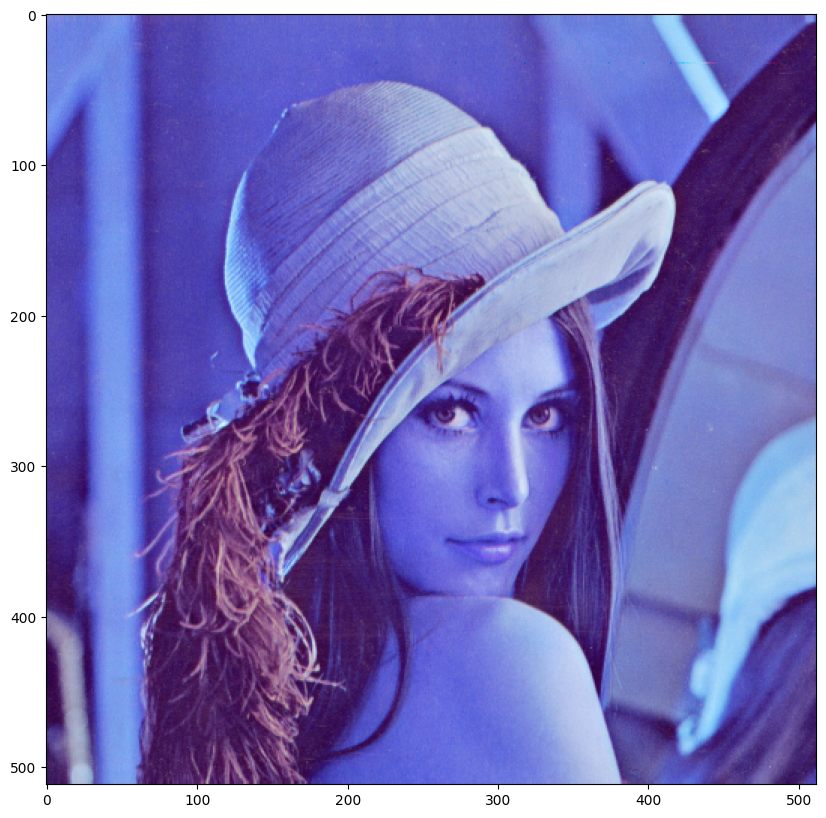

In [ ]:
# Tạo một figure (khung hiển thị) mới với kích thước 10x10 inch
plt.figure(figsize=(10,10))  

# Hiển thị ảnh image trong figure
plt.imshow(image)  
# plt.imshow() hiển thị mảng NumPy dưới dạng ảnh

# Hiển thị figure ra màn hình
plt.show()  
# plt.show() sẽ render và hiển thị tất cả nội dung figure

The image output doesn't look natural. This is because the order of RGB Channels are different. We can change the color space with conversion code and the function `cvtColor` from the `cv2` library:


In [ ]:
# Chuyển đổi ảnh từ BGR (OpenCV) sang RGB (chuẩn hiển thị của matplotlib)
new_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
# cv2.cvtColor() dùng để chuyển đổi màu sắc của ảnh
# image: mảng NumPy chứa ảnh đọc từ cv2.imread() (BGR)
# cv2.COLOR_BGR2RGB: mã chuyển đổi từ BGR sang RGB
# new_image: mảng NumPy mới với thứ tự kênh màu chuẩn RGB
# Việc này giúp khi dùng plt.imshow(new_image), màu sắc hiển thị đúng


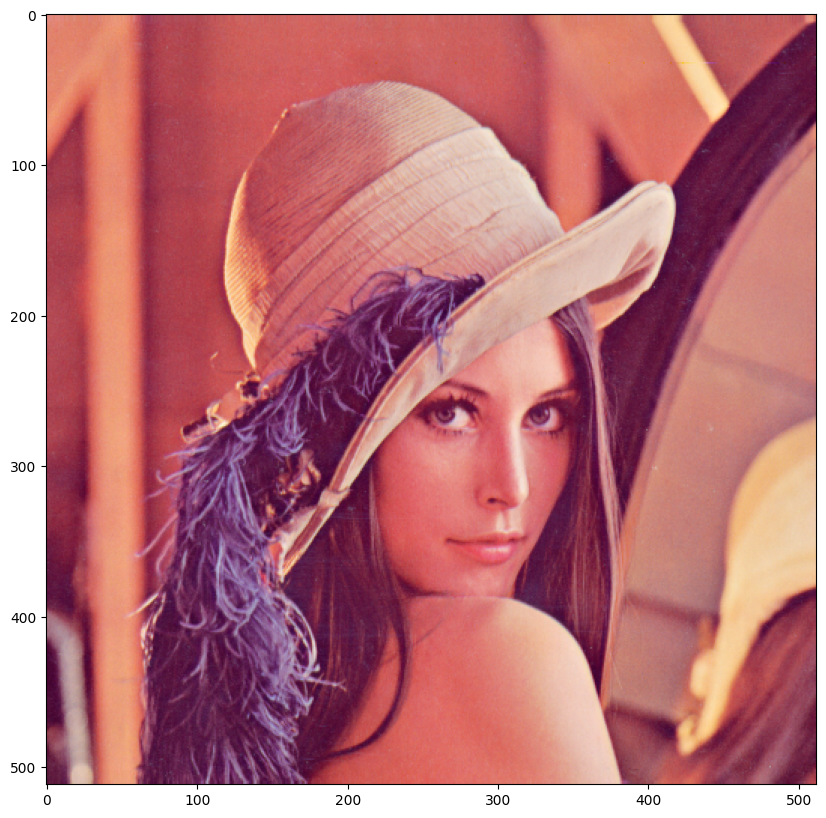

In [ ]:
# Tạo một figure mới để hiển thị ảnh, với kích thước 10x10 inch
plt.figure(figsize=(10,10))  
# figsize=(10,10) nghĩa là figure rộng 10 inch, cao 10 inch

# Hiển thị ảnh đã chuyển kênh màu từ BGR sang RGB
plt.imshow(new_image)  
# new_image là mảng NumPy sau khi dùng cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
# Bây giờ matplotlib sẽ hiển thị màu sắc chính xác (không bị lệch xanh như khi dùng ảnh gốc BGR)

# Render và hiển thị figure ra màn hình
plt.show()  
# plt.show() hiển thị toàn bộ nội dung figure (ảnh + các plot khác nếu có)

You can also load the image using its path, this comes in handy if the image is not in your working directory:


In [ ]:
import cv2  # Nhập thư viện OpenCV để xử lý ảnh

# Đọc ảnh từ file theo đường dẫn image_path
image = cv2.imread(image_path)  
# cv2.imread() đọc file ảnh từ đường dẫn image_path
# Trả về mảng NumPy 3 chiều (height, width, 3) cho ảnh màu (BGR)
# Nếu file không tồn tại hoặc đọc lỗi, image sẽ là None

# Xem kích thước của ảnh
image.shape  
# .shape trả về tuple (height, width, channels)
# height: số pixel theo chiều dọc
# width: số pixel theo chiều ngang
# channels: số kênh màu (3 cho ảnh màu BGR)


(512, 512, 3)

You can save the image as in `jpg` format.


In [ ]:
# Lưu ảnh image vào file 'lenna.jpg'
cv2.imwrite("lenna.jpg", image)  
# cv2.imwrite(filename, img) lưu mảng NumPy img thành file ảnh
# "lenna.jpg" là tên file xuất ra (có thể dùng đường dẫn tuyệt đối hoặc tương đối)
# image là mảng NumPy chứa dữ liệu ảnh
# Hàm trả về True nếu lưu thành công, False nếu thất bại

True

### Grayscale Images


Grayscale images have pixel values representing the amount of light or intensity. Light shades of gray have a high-intensity darker shades have a lower intensity. White has the highest intensity, and black the lowest. We can convert an image to Gray Scale using a color conversion code and the function <code>cvtColor</code>.


The code for RGB to gray is <code>cv2.COLOR_BGR2GRAY</code>, we apply the function:


In [ ]:
# Chuyển ảnh màu sang ảnh xám (grayscale)
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  
# cv2.cvtColor() dùng để chuyển đổi màu sắc của ảnh
# image: mảng NumPy chứa ảnh màu BGR (đọc từ cv2.imread)
# cv2.COLOR_BGR2GRAY: mã chuyển đổi từ BGR sang grayscale
# image_gray: mảng NumPy 2 chiều (height, width), không còn kênh màu
# Mỗi pixel trong ảnh xám có giá trị từ 0 (đen) đến 255 (trắng)

The image array has only two dimensions, i.e. only one color channel:


In [ ]:
# Xem kích thước của ảnh xám vừa tạo
image_gray.shape  
# .shape trả về tuple kích thước của mảng NumPy
# Vì image_gray là ảnh grayscale (2D), shape sẽ là (height, width)
# height: số pixel theo chiều dọc
# width: số pixel theo chiều ngang

(512, 512)

We can plot the image using `imshow` but we have to specify the color map is gray:


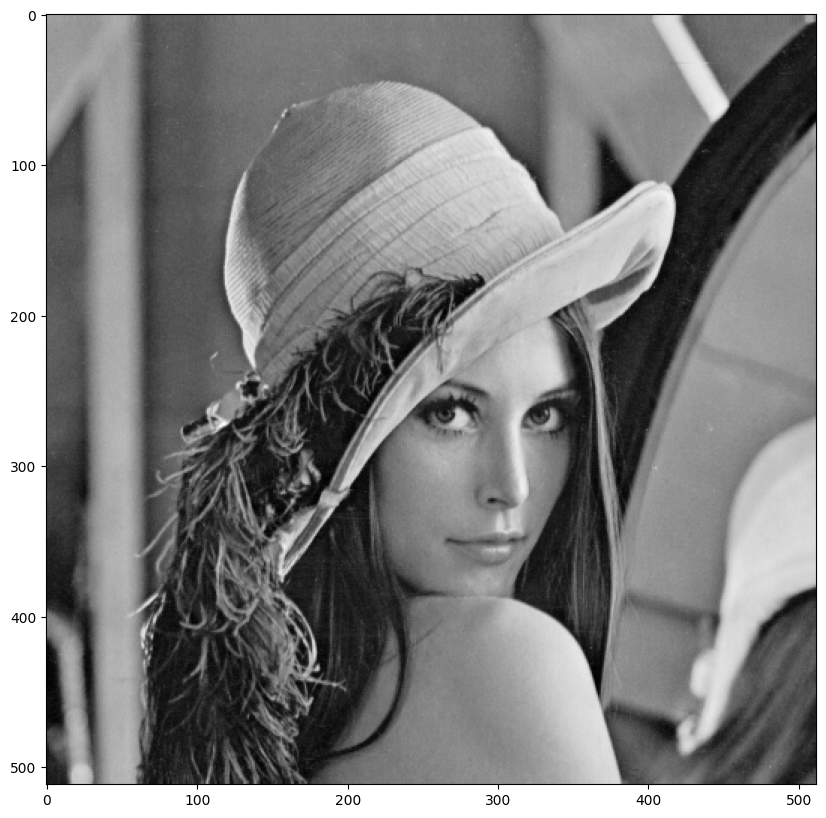

In [ ]:
# Tạo một figure mới để hiển thị ảnh, với kích thước 10x10 inch
plt.figure(figsize=(10, 10))  
# figsize=(10,10) nghĩa là figure rộng 10 inch, cao 10 inch

# Hiển thị ảnh xám (grayscale)
plt.imshow(image_gray, cmap='gray')  
# image_gray là mảng NumPy 2D (height, width) sau khi chuyển sang grayscale
# cmap='gray' chỉ định color map màu xám, matplotlib sẽ hiển thị giá trị pixel từ 0→255 dưới dạng màu đen→trắng

# Render và hiển thị figure ra màn hình
plt.show()  
# plt.show() hiển thị toàn bộ figure

We can save the image as a grayscale image, let's save it as a `jpg` as well, in the working directory.


In [ ]:
# Lưu ảnh grayscale vào file 'lena_gray_cv.jpg'
cv2.imwrite('lena_gray_cv.jpg', image_gray)  
# cv2.imwrite(filename, img) lưu mảng NumPy img thành file ảnh
# 'lena_gray_cv.jpg' là tên file xuất ra (có thể dùng đường dẫn tuyệt đối hoặc tương đối)
# image_gray là mảng NumPy 2D (grayscale) với giá trị pixel từ 0 → 255
# Hàm trả về True nếu lưu thành công, False nếu thất bại
# Định dạng lưu dựa vào đuôi file (.jpg, .png,...)

True

You can also load in a grayscale image we have to set <code>flag</code> parameter to gray color conversation code: <code>cv2.COLOR_BGR2GRAY</code>:


In [ ]:
# Đọc ảnh 'barbara.png' trực tiếp dưới dạng grayscale
im_gray = cv2.imread('barbara.png', cv2.IMREAD_GRAYSCALE)  
# cv2.imread(filename, flag) đọc file ảnh
# cv2.IMREAD_GRAYSCALE là flag cho biết đọc ảnh trực tiếp dưới dạng grayscale
#   → OpenCV sẽ trả về một mảng NumPy 2D (height, width), không có kênh màu
#   → Mỗi pixel có giá trị từ 0 (đen) đến 255 (trắng)
# im_gray: mảng NumPy 2D chứa ảnh xám
# Nếu file không tồn tại hoặc lỗi đọc → im_gray = None

We can plot the image:


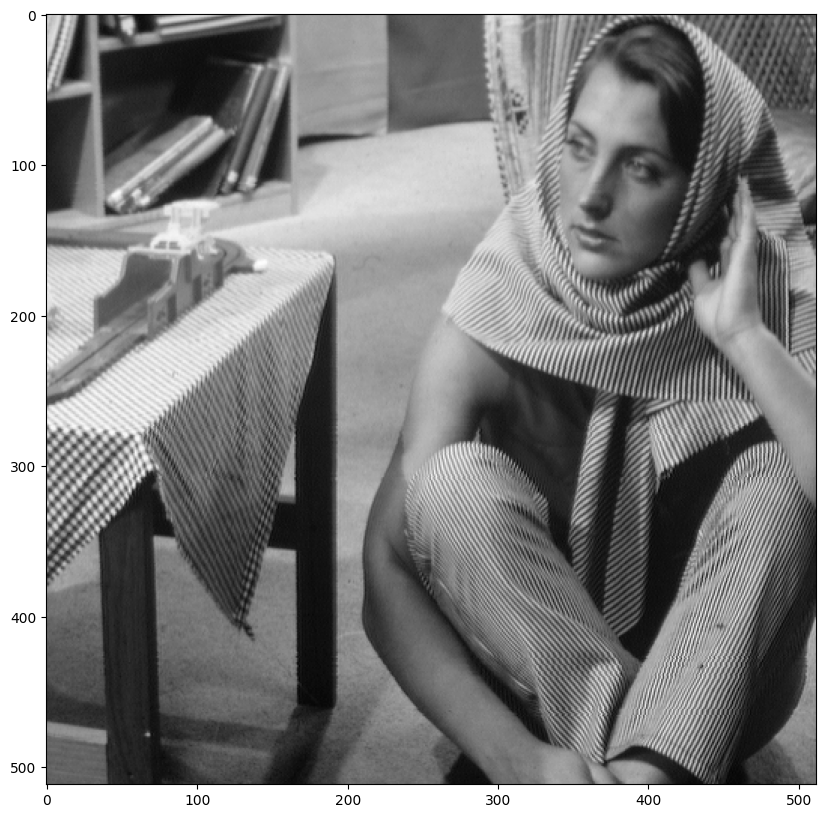

In [ ]:
# Tạo một figure mới để hiển thị ảnh, với kích thước 10x10 inch
plt.figure(figsize=(10,10))  
# figsize=(10,10) nghĩa là figure rộng 10 inch, cao 10 inch

# Hiển thị ảnh grayscale đã đọc trực tiếp
plt.imshow(im_gray, cmap='gray')  
# im_gray là mảng NumPy 2D (height, width) từ cv2.imread(..., cv2.IMREAD_GRAYSCALE)
# cmap='gray' chỉ định color map màu xám
# Mỗi pixel có giá trị từ 0 → 255, matplotlib sẽ chuyển thành màu từ đen → trắng

# Render và hiển thị figure ra màn hình
plt.show()  
# plt.show() hiển thị figure, cho phép xem ảnh trực quan

### Color Channels  


We can also work with the different color channels. Consider the following image:


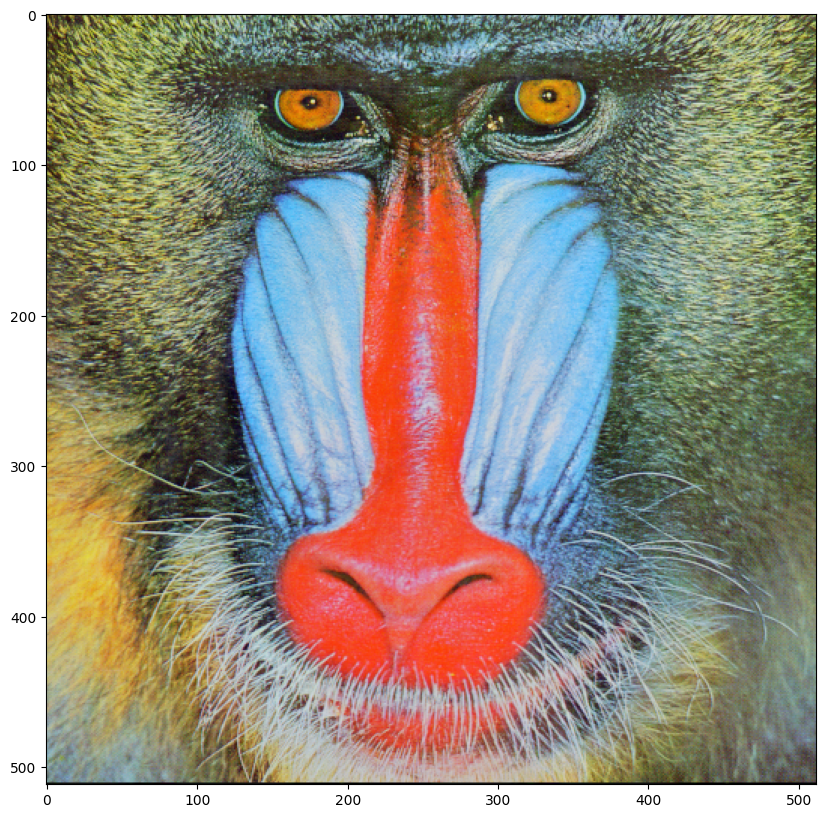

In [ ]:
# Đọc ảnh 'baboon.png' bằng OpenCV
baboon = cv2.imread('baboon.png')  
# cv2.imread(filename) đọc file ảnh từ đĩa
# Trả về mảng NumPy 3 chiều (height, width, 3) cho ảnh màu BGR
# Nếu file không tồn tại hoặc đọc lỗi → baboon = None

# Tạo một figure mới với kích thước 10x10 inch để hiển thị ảnh
plt.figure(figsize=(10,10))  
# figsize=(10,10) nghĩa là figure rộng 10 inch, cao 10 inch

# Hiển thị ảnh bằng matplotlib
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))  
# cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB) chuyển ảnh từ BGR (OpenCV) sang RGB
# Matplotlib hiển thị màu theo RGB, nếu không chuyển sẽ bị lệch màu (xanh quá nhiều)
# plt.imshow() vẽ mảng NumPy dưới dạng ảnh

# Render và hiển thị figure
plt.show()  
# plt.show() hiện ảnh ra màn hình

We can obtain the different RGB colors and assign them to the variables <code>blue</code>, <code>green</code>, and <code>red</code>, in (B, G, R) format.


In [ ]:
# Tách các kênh màu riêng biệt từ ảnh baboon
blue, green, red = baboon[:, :, 0], baboon[:, :, 1], baboon[:, :, 2]  
# baboon là mảng NumPy 3 chiều (height, width, 3) với thứ tự kênh màu BGR
# baboon[:, :, 0] → kênh Blue (tất cả pixel trong kênh B)
# baboon[:, :, 1] → kênh Green (tất cả pixel trong kênh G)
# baboon[:, :, 2] → kênh Red (tất cả pixel trong kênh R)

We can concatenate each image channel the images using the function <code>vconcat</code>.


In [ ]:
# Ghép các kênh màu Blue, Green, Red theo chiều dọc
im_bgr = cv2.vconcat([blue, green, red])  
# cv2.vconcat(list_of_images) → nối các mảng ảnh theo chiều dọc
# blue, green, red là các mảng 2D (height, width) của từng kênh màu
# Kết quả im_bgr là một mảng NumPy 2D có chiều cao = 3 * height, chiều rộng = width
# Cụ thể:
#   - Phần trên là kênh Blue
#   - Phần giữa là kênh Green
#   - Phần dưới là kênh Red

Plotting the color image next to the red channel in grayscale, we see that regions with red have higher intensity values.


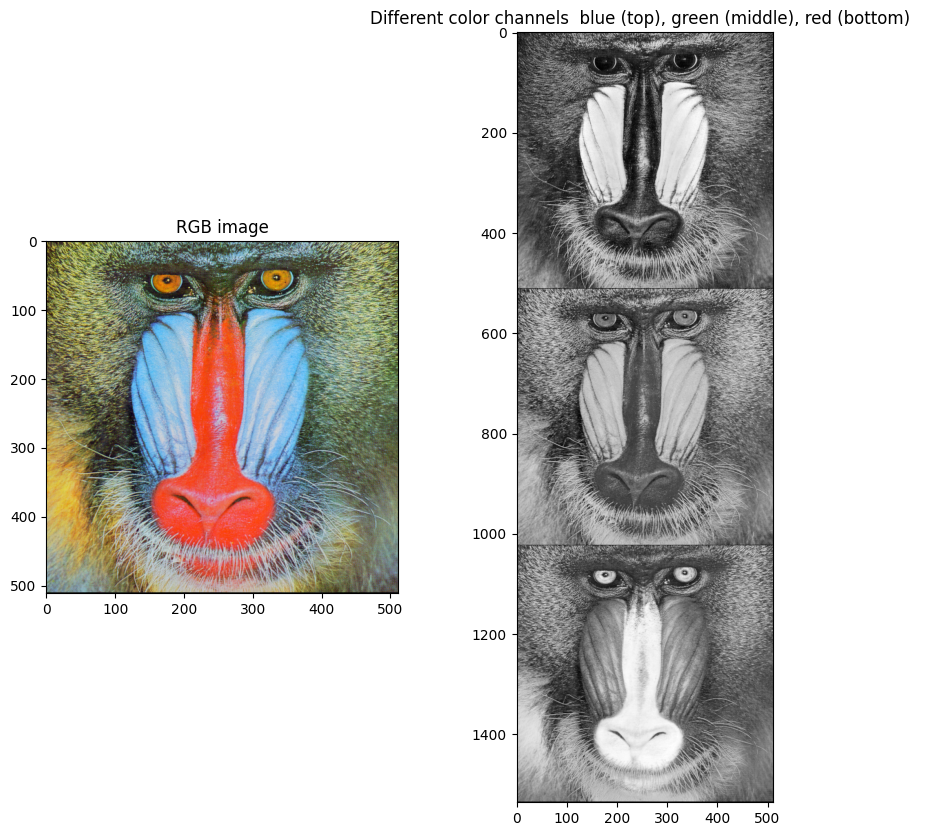

In [ ]:
# Tạo một figure mới với kích thước 10x10 inch
plt.figure(figsize=(10,10))  
# figsize=(10,10) nghĩa là figure rộng 10 inch, cao 10 inch

# Vẽ subplot đầu tiên (1 hàng, 2 cột, vị trí 1)
plt.subplot(121)  
# subplot(1,2,1) → chia figure thành 1 hàng 2 cột, vẽ ở vị trí 1

# Hiển thị ảnh baboon màu RGB
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))  
# cv2.cvtColor(..., cv2.COLOR_BGR2RGB) chuyển ảnh từ BGR sang RGB
# Matplotlib hiển thị màu theo RGB, nếu không chuyển màu sẽ bị lệch (xanh quá mạnh)

# Thêm tiêu đề cho subplot đầu
plt.title("RGB image")  
# Hiển thị chữ "RGB image" trên ảnh

# Vẽ subplot thứ hai (vị trí 2)
plt.subplot(122)  
# subplot(1,2,2) → cùng figure, vị trí 2 (bên phải)

# Hiển thị ảnh các kênh màu đã ghép theo chiều dọc
plt.imshow(im_bgr, cmap='gray')  
# im_bgr là ảnh 2D ghép từ kênh Blue (top), Green (middle), Red (bottom)
# cmap='gray' → hiển thị ảnh grayscale để thấy cường độ pixel của từng kênh
# Mỗi kênh thể hiện cường độ riêng từ 0 → 255

# Thêm tiêu đề cho subplot thứ hai
plt.title("Different color channels  blue (top), green (middle), red (bottom)")  

# Render và hiển thị figure
plt.show()  
# plt.show() hiển thị toàn bộ figure gồm 2 subplot

### Indexing  


We can use numpy slicing. For example, we can return the first 256 rows corresponding to the top half of the image:


In [ ]:
# Gán số hàng (chiều cao) mong muốn cho ảnh 
rows = 256

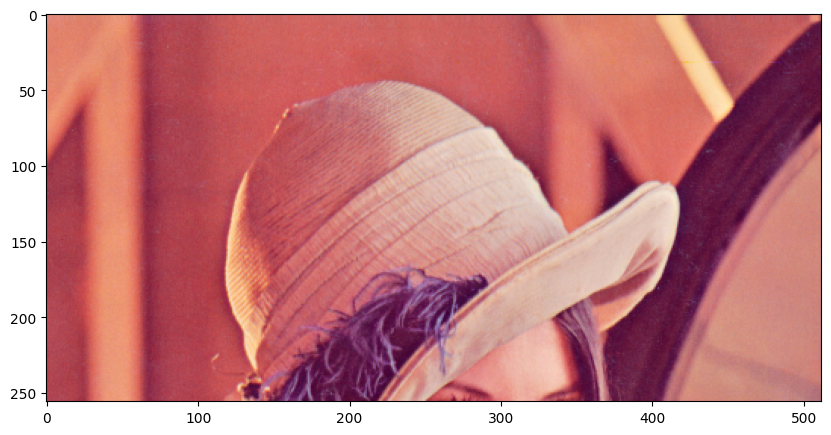

In [ ]:
# Tạo figure mới với kích thước 10x10 inch
plt.figure(figsize=(10,10))

# Hiển thị phần ảnh từ hàng 0 đến hàng 255
# Cắt ảnh theo chiều dọc (giữ nguyên tất cả cột và kênh màu)
plt.imshow(new_image[0:rows, :, :])

# Hiển thị ảnh
plt.show()

We can also return the first 256 columns corresponding to the first half of the image:


In [ ]:
# Gán số cột (chiều cao) mong muốn cho ảnh 
columns = 256

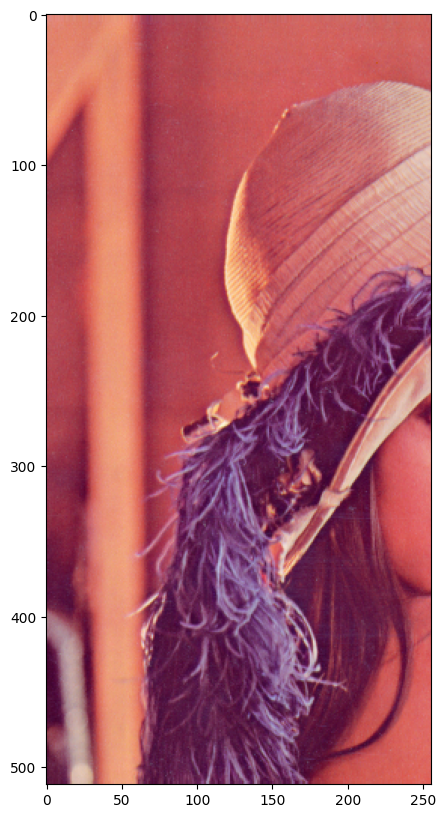

In [ ]:
# Tạo figure mới với kích thước 10x10 inch
plt.figure(figsize=(10,10))

# Hiển thị phần ảnh từ cột 0 đến cột 255
# Cắt ảnh theo chiều ngang (giữ nguyên tất cả các hàng và kênh màu)
plt.imshow(new_image[:, 0:columns, :])

# Hiển thị ảnh
plt.show()

If you want to reassign an array to another variable, you should use the `copy` method (we will cover this in the next section).


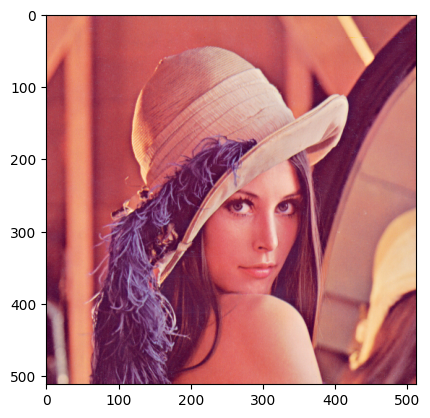

In [ ]:
# Tạo bản sao của ảnh RGB đã chuyển kênh
A = new_image.copy()  
# new_image là ảnh RGB (mảng NumPy 3D, height x width x 3)
# .copy() tạo một bản sao hoàn toàn mới, 
#   không liên kết với mảng gốc (thay đổi A sẽ không ảnh hưởng new_image)

# Hiển thị ảnh A bằng matplotlib
plt.imshow(A)  
# Hiển thị mảng NumPy A dưới dạng ảnh
# A đã ở định dạng RGB, nên màu sắc sẽ hiển thị chính xác

# Render và hiển thị figure
plt.show()  
# plt.show() hiển thị figure ra màn hình

If we do not apply the method `copy()`, the variable will point to the same location in memory. Consider the variable `B` below, if we set all values of array `A` to zero, since `A` and `B` points to the same object in the memory, `B` will also have all-zero elements:


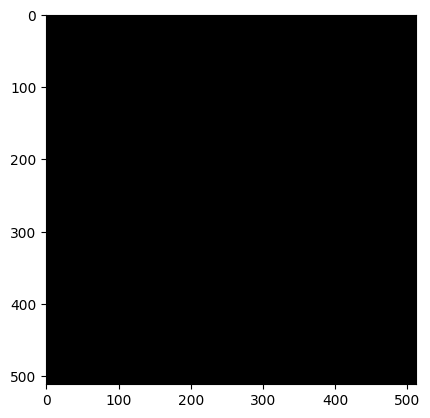

In [ ]:
# Gán B bằng A, không dùng .copy()
B = A  
# B và A tham chiếu cùng một mảng NumPy
# Mọi thay đổi trên A sẽ ảnh hưởng trực tiếp đến B và ngược lại

# Đặt tất cả pixel của A = 0 (ảnh đen hoàn toàn)
A[:,:,:] = 0  
# Vì B tham chiếu cùng mảng với A, nên B cũng bị ảnh hưởng
# A[:,:,:] = 0 có nghĩa: tất cả hàng, tất cả cột, tất cả kênh màu = 0

# Hiển thị B
plt.imshow(B)  
# Mảng B bây giờ cũng hoàn toàn đen (0,0,0) do liên kết với A

# Render và hiển thị figure
plt.show()  

We can also manipulate elements using indexing. In the following piece of code, we create a new array `baboon_red` and set all but the red color channels to zero. Therefore, when we display the image, it appears red:


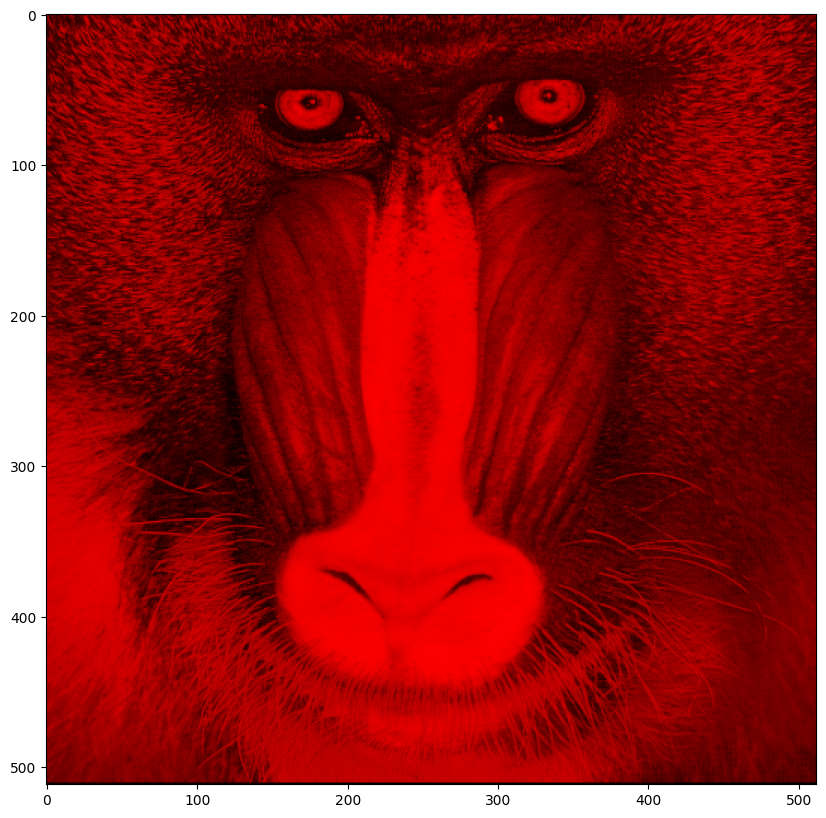

In [ ]:
# Tạo bản sao của ảnh baboon
baboon_red = baboon.copy()  
# .copy() tạo mảng NumPy mới, không liên kết với ảnh gốc
# Thay đổi baboon_red sẽ không ảnh hưởng tới baboon

# Đặt kênh Blue = 0
baboon_red[:, :, 0] = 0  
# Loại bỏ hoàn toàn thông tin màu xanh (Blue) trong ảnh

# Đặt kênh Green = 0
baboon_red[:, :, 1] = 0  
# Loại bỏ hoàn toàn thông tin màu xanh lá (Green)
# Chỉ còn kênh Red giữ nguyên → ảnh chỉ còn màu đỏ

# Tạo figure để hiển thị ảnh
plt.figure(figsize=(10, 10))  
# Kích thước figure 10x10 inch

# Hiển thị ảnh chỉ còn kênh Red
plt.imshow(cv2.cvtColor(baboon_red, cv2.COLOR_BGR2RGB))  
# Chuyển từ BGR → RGB để matplotlib hiển thị màu đúng
# Do Blue và Green = 0, ảnh hiển thị toàn bộ các pixel theo kênh Red

# Hiển thị figure
plt.show()  

We can do the same for blue:  


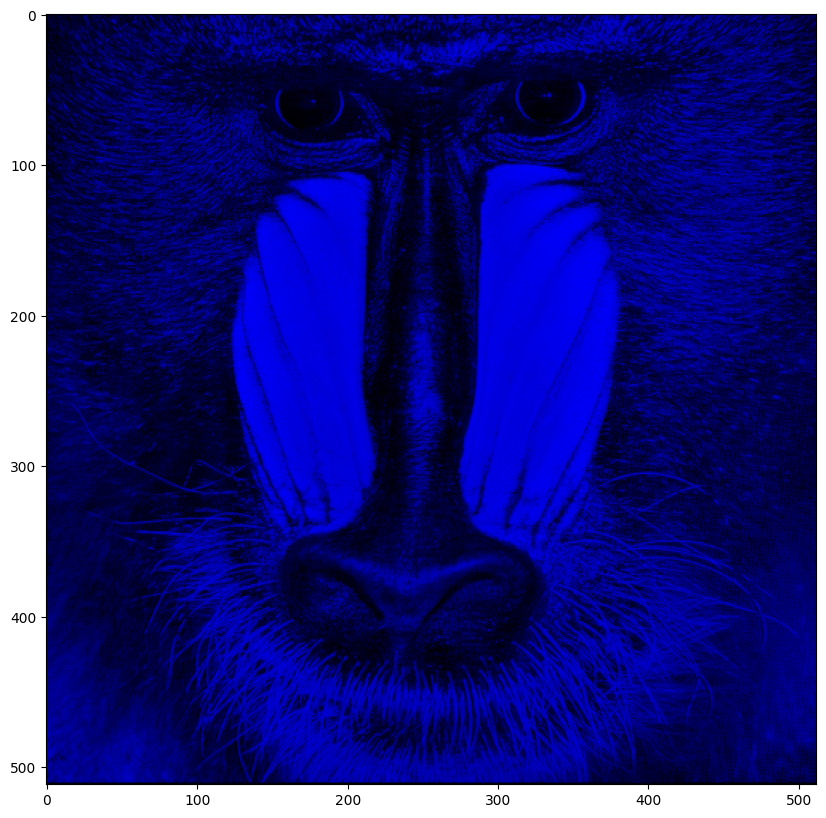

In [ ]:
# Tạo bản sao của ảnh baboon
baboon_blue = baboon.copy()  
# .copy() tạo một mảng NumPy mới, không liên kết với ảnh gốc
# Thay đổi baboon_blue sẽ không ảnh hưởng tới baboon

# Đặt kênh Green = 0
baboon_blue[:, :, 1] = 0  
# Loại bỏ hoàn toàn thông tin màu xanh lá (Green)

# Đặt kênh Red = 0
baboon_blue[:, :, 2] = 0  
# Loại bỏ hoàn toàn thông tin màu đỏ (Red)
# Chỉ còn kênh Blue giữ nguyên → ảnh chỉ còn màu xanh dương

# Tạo figure để hiển thị ảnh
plt.figure(figsize=(10, 10))  
# Kích thước figure 10x10 inch

# Hiển thị ảnh chỉ còn kênh Blue
plt.imshow(cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB))  
# Chuyển từ BGR → RGB để matplotlib hiển thị màu đúng
# Vì Green và Red = 0, ảnh hiển thị toàn bộ các pixel theo kênh Blue

# Hiển thị figure
plt.show()  

We can do the same for green:


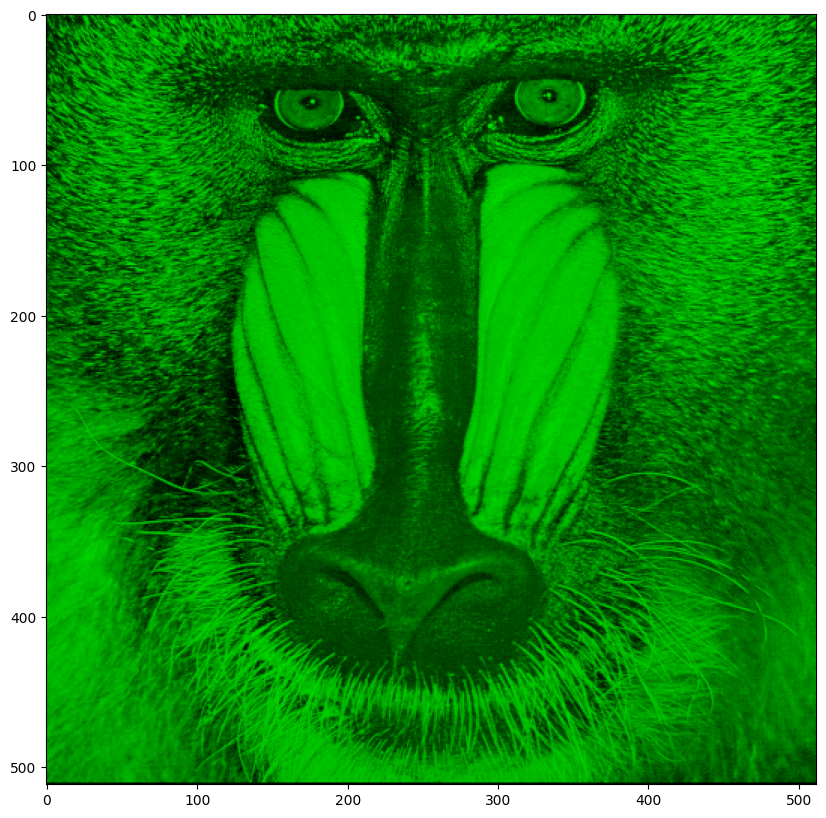

In [ ]:
# Tạo bản sao của ảnh baboon
baboon_green = baboon.copy()  
# .copy() tạo một mảng NumPy mới, không liên kết với ảnh gốc
# Thay đổi baboon_green sẽ không ảnh hưởng tới baboon

# Đặt kênh Blue = 0
baboon_green[:, :, 0] = 0  
# Loại bỏ hoàn toàn thông tin màu xanh dương (Blue)

# Đặt kênh Red = 0
baboon_green[:, :, 2] = 0  
# Loại bỏ hoàn toàn thông tin màu đỏ (Red)
# Chỉ còn kênh Green giữ nguyên → ảnh chỉ còn màu xanh lá

# Tạo figure để hiển thị ảnh
plt.figure(figsize=(10,10))  
# Kích thước figure 10x10 inch

# Hiển thị ảnh chỉ còn kênh Green
plt.imshow(cv2.cvtColor(baboon_green, cv2.COLOR_BGR2RGB))  
# Chuyển từ BGR → RGB để matplotlib hiển thị màu đúng
# Vì Blue và Red = 0, ảnh hiển thị toàn bộ các pixel theo kênh Green

# Hiển thị figure
plt.show()  

In [ ]:
# Đọc ảnh 'baboon.png' từ file bằng OpenCV
image = cv2.imread('baboon.png')  
# cv2.imread(filename) đọc file ảnh từ đường dẫn
# Trả về một mảng NumPy 3 chiều (height, width, 3) với thứ tự kênh màu BGR
# height: số pixel theo chiều dọc
# width: số pixel theo chiều ngang
# channels: 3 kênh màu B, G, R
# Nếu file không tồn tại hoặc đọc lỗi, image sẽ là None


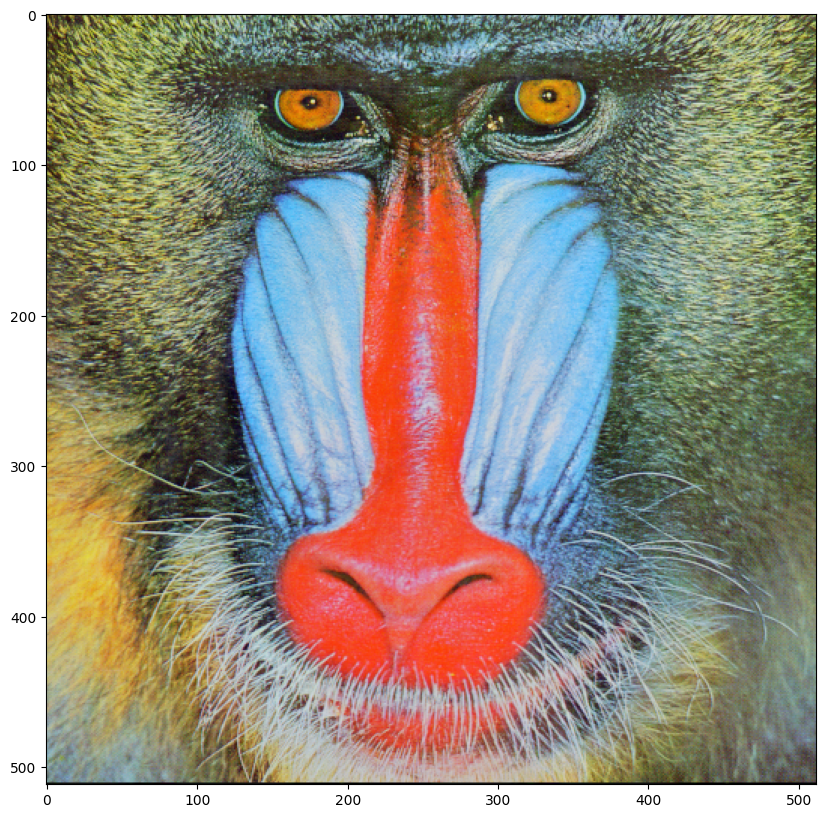

In [ ]:
# Tạo một figure mới với kích thước 10x10 inch
plt.figure(figsize=(10,10))  
# figsize=(10,10) nghĩa là figure rộng 10 inch, cao 10 inch

# Hiển thị ảnh baboon đọc từ OpenCV
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  
# cv2.cvtColor(image, cv2.COLOR_BGR2RGB) chuyển ảnh từ BGR → RGB
# OpenCV lưu ảnh theo BGR, nhưng matplotlib hiển thị theo RGB
# Nếu không chuyển màu, ảnh hiển thị sẽ bị lệch (xanh quá nhiều)

# Render và hiển thị figure
plt.show()  
# plt.show() hiển thị toàn bộ figure ra màn hình


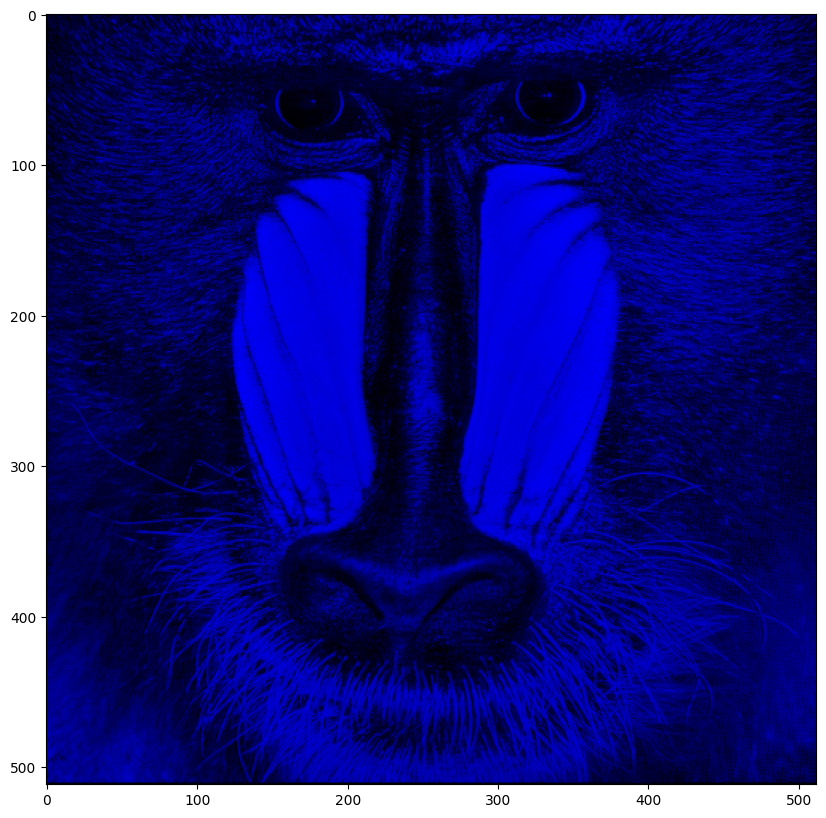

In [ ]:
# Đọc ảnh 'baboon.png' từ file bằng OpenCV
image = cv2.imread('baboon.png')  
# cv2.imread(filename) đọc file ảnh từ đường dẫn
# Trả về mảng NumPy 3 chiều (height, width, 3) với thứ tự kênh màu BGR
# Nếu file không tồn tại hoặc đọc lỗi → image = None

# Tạo bản sao của ảnh để thao tác, tránh ảnh gốc bị thay đổi
baboon_blue = image.copy()  
# .copy() tạo mảng NumPy độc lập, thay đổi baboon_blue sẽ không ảnh hưởng image

# Loại bỏ các kênh Green và Red
baboon_blue[:, :, 1] = 0  # Green = 0
baboon_blue[:, :, 2] = 0  # Red = 0
# Chỉ còn kênh Blue giữ nguyên
# Kết quả: ảnh chỉ hiển thị màu xanh dương (Blue)

# Tạo figure để hiển thị ảnh
plt.figure(figsize=(10,10))  
# figsize=(10,10) → figure rộng 10 inch, cao 10 inch

# Hiển thị ảnh chỉ còn kênh Blue
plt.imshow(cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB))  
# cv2.cvtColor(..., cv2.COLOR_BGR2RGB) → chuyển từ BGR sang RGB để matplotlib hiển thị đúng màu
# Vì Green và Red = 0, ảnh hiển thị toàn bộ các pixel theo kênh Blue

# Hiển thị figure
plt.show()  

### Question 1: 
Use the image `baboon.png` from this lab or take any image you like.

Open the image and create a OpenCV Image object called `baboon_blue`, convert the image from BGR format to RGB format, get the blue channel out of it, and finally plot the image


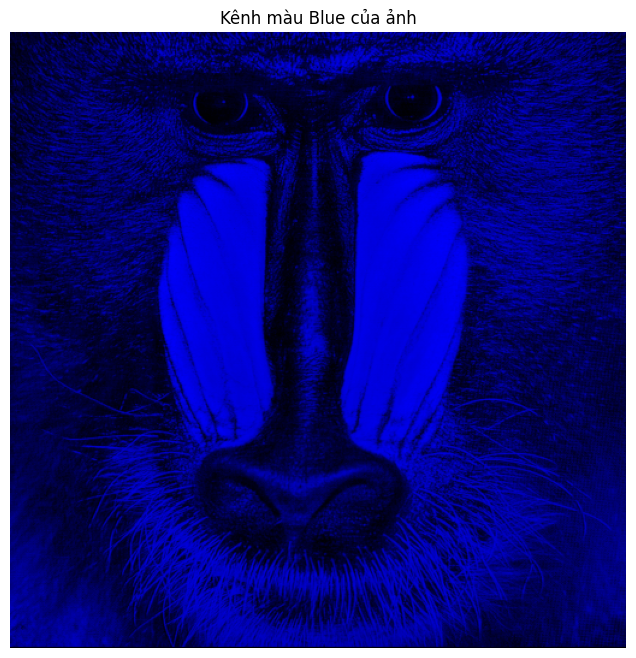

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

image = cv2.imread('baboon.png')  

baboon_blue = image.copy()  

baboon_blue[:, :, 1] = 0  
baboon_blue[:, :, 2] = 0  

baboon_blue_rgb = cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB)  

plt.figure(figsize=(8, 8))  
plt.imshow(baboon_blue_rgb)  
plt.title("Kênh màu Blue của ảnh")  
plt.axis('off')  
plt.show()

Double-click **here** for a hint.

<!-- The hint is below:

baboon_blue[:,:,2] = 0

-->


Double-click **here** for the solution.

<!-- The answer is below:

baboon_blue=cv2.imread('baboon.png')
baboon_blue=cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB)
baboon_blue[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_blue)
plt.show()

-->


# References 


[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).



# So sánh chi tiết thư viện Pillow (PIL) và OpenCV


**1. Về mục đích và mức độ sử dụng:**

* **Pillow (PIL):** Được thiết kế đơn giản, tập trung vào việc mở, thao tác cơ bản (cắt, xoay, thay đổi kích thước) và lưu trữ ảnh. Đây là thư viện thân thiện, dễ học cho người mới bắt đầu.
* **OpenCV:** Là thư viện mạnh mẽ chuyên về thị giác máy tính (Computer Vision). Nó cung cấp các thuật toán phức tạp hơn như nhận diện khuôn mặt, tách biên, và xử lý video thời gian thực.

**2. Kiểu dữ liệu và cấu trúc:**

* **Pillow (PIL):** Khi đọc ảnh, nó tạo ra một đối tượng đặc thù của thư viện (ví dụ: `PIL.Image.Image`). Để tính toán ma trận, ta thường phải chuyển đổi thủ công sang mảng NumPy bằng lệnh `np.array()`.
* **OpenCV:** Đọc ảnh trực tiếp dưới dạng mảng **NumPy ndarray**. Điều này giúp OpenCV cực kỳ tối ưu cho các phép toán ma trận và tương thích tốt với các thư viện khoa học dữ liệu khác.

**3. Thứ tự các kênh màu (Điểm khác biệt quan trọng nhất):**

* **Pillow (PIL):** Sử dụng hệ màu chuẩn **RGB** (Red - Green - Blue). Khi hiển thị bằng Matplotlib, màu sắc sẽ chính xác ngay lập tức.
* **OpenCV:** Sử dụng hệ màu **BGR** (Blue - Green - Red). Do đó, nếu dùng Matplotlib để hiển thị ảnh từ OpenCV mà không chuyển đổi (qua hàm `cv2.cvtColor`), màu Đỏ và màu Xanh lam sẽ bị tráo đổi cho nhau.

**4. Phương thức hoạt động và cú pháp:**

* **Pillow (PIL):** Sử dụng phương thức `Image.open()` để đọc ảnh và các phương thức hướng đối tượng như `image.save()`, `image.crop()`.
* **OpenCV:** Sử dụng các hàm chức năng như `cv2.imread()` để đọc, `cv2.imwrite()` để lưu và `cv2.imshow()` để hiển thị trong cửa sổ riêng của OpenCV.

**5. Ứng dụng trong Deep Learning:**

* **Pillow (PIL):** Thường được dùng làm chuẩn đầu vào cho các mô hình học sâu như PyTorch hoặc Keras nhờ tính đơn giản và hệ màu RGB chuẩn.
* **OpenCV:** Được ưu tiên trong các ứng dụng cần tốc độ cao, xử lý luồng camera trực tiếp và các bài toán phân tích hình học phức tạp.


<!--<h2>Change Log</h2>-->


<!--
<table>
    <tr>
        <th>Date (YYYY-MM-DD)</th>
        <th>Version</th>
        <th>Changed By</th>
        <th>Change Description</th>
    </tr>
    <tr>
        <td>2020-07-20</td>
        <td>0.2</td>
        <td>Azim</td>
        <td>Modified Multiple Areas</td>
    </tr>
    <tr>
        <td>2020-07-17</td>
        <td>0.1</td>
        <td>Azim</td>
        <td>Created Lab Template</td>
    </tr>
    <tr>
        <td>2021-03-06</td>
        <td>0.3</td>
        <td>Nayef</td>
        <td>Modified some codes</td>
    </tr>
</table>
-->
